# Autoencoder network with HCP Dataset

This notebook illustrates the use of the autoencoder in MONAI for the purpose of functional connectivity matrices.

## Setup imports

In [19]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset
import time
from sklearn.model_selection import train_test_split
import pylab as pl
from IPython import display
import logging
import os
import shutil
import sys
import torch.nn as nn
import tempfile
import random
import numpy as np
from tqdm import trange
import matplotlib.pyplot as plt
import torch
from urllib.request import urlretrieve
import gzip
from PIL import Image
import pathlib
from pathlib import Path
import pandas as pd
from monai.networks.nets import AutoEncoder
import monai
from monai.apps import download_and_extract
from monai.config import print_config
from monai.data import CacheDataset, DataLoader
from monai.networks.nets import VarAutoEncoder
from monai.transforms import (
    EnsureChannelFirstD,
    Compose,
    LoadImageD,
    ScaleIntensityD,
    EnsureTypeD,
)
from monai.utils import set_determinism

In [20]:
SEED = 1380
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(SEED)
random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

## Setup data directory

In [21]:
directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/tmp/tmp4jk72c9s


In [22]:
logging.basicConfig(stream=sys.stdout, level=logging.INFO)
set_determinism(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Get the data

In [23]:
data_directory = "Data/hcp_rest_and_motor/hcp_rest_and_motor/"

In [24]:
os.listdir(data_directory)

['182739_tfMRI_MOTOR_LR.csv',
 '180230_rfMRI_REST1_LR.csv',
 '285446_rfMRI_REST1_LR.csv',
 '275645_tfMRI_MOTOR_LR.csv',
 '112314_rfMRI_REST1_LR.csv',
 '138231_rfMRI_REST1_LR.csv',
 '158540_tfMRI_MOTOR_LR.csv',
 '135124_tfMRI_MOTOR_LR.csv',
 '153934_tfMRI_MOTOR_LR.csv',
 '134324_tfMRI_MOTOR_LR.csv',
 '118932_rfMRI_REST1_LR.csv',
 '393550_tfMRI_MOTOR_LR.csv',
 '145834_rfMRI_REST1_LR.csv',
 '148840_tfMRI_MOTOR_LR.csv',
 '724446_rfMRI_REST1_LR.csv',
 '692964_rfMRI_REST1_LR.csv',
 '103111_rfMRI_REST1_LR.csv',
 '558960_tfMRI_MOTOR_LR.csv',
 '151930_tfMRI_MOTOR_LR.csv',
 '130114_tfMRI_MOTOR_LR.csv',
 '114217_tfMRI_MOTOR_LR.csv',
 '250427_tfMRI_MOTOR_LR.csv',
 '304020_rfMRI_REST1_LR.csv',
 '376247_tfMRI_MOTOR_LR.csv',
 '151728_rfMRI_REST1_LR.csv',
 '436845_rfMRI_REST1_LR.csv',
 '108525_rfMRI_REST1_LR.csv',
 '108121_tfMRI_MOTOR_LR.csv',
 '187143_tfMRI_MOTOR_LR.csv',
 '180533_rfMRI_REST1_LR.csv',
 '122822_rfMRI_REST1_LR.csv',
 '224022_tfMRI_MOTOR_LR.csv',
 '545345_rfMRI_REST1_LR.csv',
 '436239_r

**1.1 Plot sample matrices**

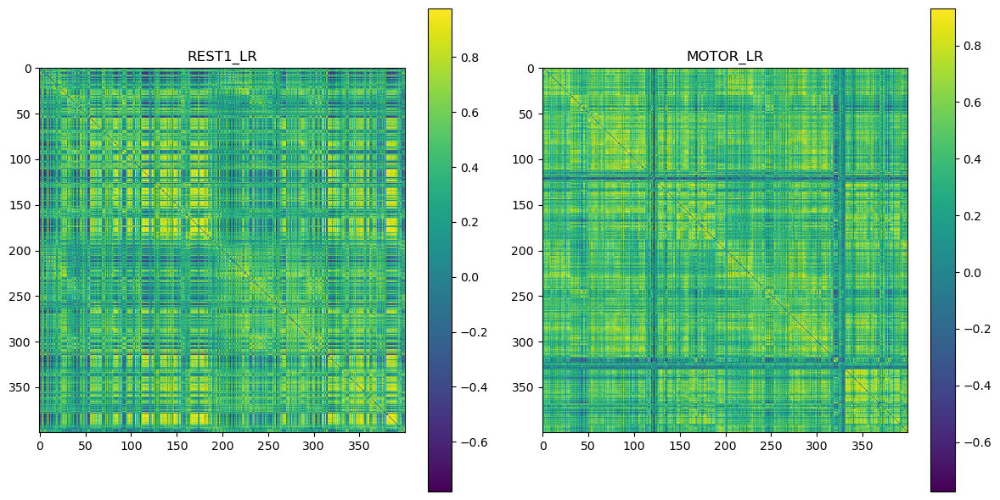

In [25]:
rest_data = np.loadtxt("Data/hcp_rest_and_motor/hcp_rest_and_motor/580751_rfMRI_REST1_LR.csv", delimiter=",", skiprows=1)
motor_data = np.loadtxt("Data/hcp_rest_and_motor/hcp_rest_and_motor/580751_tfMRI_MOTOR_LR.csv", delimiter=",", skiprows=1)

plt.figure(figsize=(12, 6)) 

# Heatmap for 580751_rfMRI_REST1_LR.csv
plt.subplot(1, 2, 1)
plt.imshow(rest_data, cmap='viridis', interpolation='nearest')
plt.title("REST1_LR")
plt.colorbar()

# Heatmap for 580751_rfMRI_MOTOR_LR.csv
plt.subplot(1, 2, 2)
plt.imshow(motor_data, cmap='viridis', interpolation='nearest')
plt.title("MOTOR_LR")
plt.colorbar()

plt.tight_layout()  
plt.show()

**1.2. Create class to load our FC matrices**

In [26]:
class FMRIConnectivityDataset(Dataset):
    def __init__(self, data_directory, ids, transform=None):
        self.transform = transform
        self.data = [] 

        for subject_id in ids:
            rest_file_path = os.path.join(data_directory, f"{subject_id}_rfMRI_REST1_LR.csv")
            motor_file_path = os.path.join(data_directory, f"{subject_id}_tfMRI_MOTOR_LR.csv")

            if os.path.exists(rest_file_path) and os.path.exists(motor_file_path):
                rest_data = pd.read_csv(rest_file_path)
                motor_data = pd.read_csv(motor_file_path)

                self.data.append((subject_id, rest_data.values, motor_data.values))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        subject_id, rest_fMRI_matrix, motor_task_fMRI_matrix = self.data[idx]

        data_dict = {
            "subject_id": subject_id,
            "rest_fMRI_data": torch.FloatTensor(rest_fMRI_matrix[np.newaxis,:,:]),
            "motor_task_fMRI_data": torch.FloatTensor(motor_task_fMRI_matrix[np.newaxis,:,:])
        }

        return data_dict

**1.3. Train without early stopping**

In [9]:
# #TEST for MSE loss
# def test(model, test_data_loader, device):
#     model.eval()
#     test_losses = []

#     for batch_data in test_data_loader:
#         rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
#         rest = rest.to(device)
#         motor = motor.to(device)
#         with torch.no_grad():
#             outputs = model(rest)
#         loss = loss_function(outputs, motor)
#         test_losses.append(loss.item())

#     return test_losses

In [10]:
#TEST for BCE loss
def test(model, test_data_loader, device):
    model.eval()
    test_losses = []

    for batch_data in test_data_loader:
        rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
        rest = rest.to(device)
        motor = motor.to(device)
        with torch.no_grad():
            outputs = model(rest)
            outputs = F.sigmoid(outputs)
        loss = loss_function(outputs, motor)
        test_losses.append(loss.item())

    return test_losses

In [11]:
# TRAIN WITHOUT SIGMOID FOR MSE
# def train(model, train_data_loader, validation_data_loader, test_data_loader, max_epochs, learning_rate, device):
#     epoch_loss_values = []
#     validation_loss_values = []

#     optimizer = torch.optim.Adam(model.parameters(), learning_rate)

#     t = trange(max_epochs, desc=f"Training -- epoch 0, avg loss: inf", leave=True)

#     for epoch in range(max_epochs):
#         model.train()
#         epoch_loss = 0
#         step = 0

#         for batch_data in train_data_loader:
#             step += 1
#             rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
#             rest = rest.to(device)
#             motor = motor.to(device)
#             optimizer.zero_grad()
#             outputs = model(rest)
# #             print(outputs)
#             loss = loss_function(outputs, motor)
#             loss.backward()
#             optimizer.step()
#             epoch_loss += loss.item()

#         epoch_loss /= step
#         epoch_loss_values.append(epoch_loss)

#         # Calculate the validation loss
#         model.eval()
#         validation_loss = 0
#         validation_step = 0

#         with torch.no_grad():
#             for batch_data in validation_data_loader:
#                 validation_step += 1
#                 rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
#                 rest = rest.to(device)
#                 motor = motor.to(device)
#                 outputs = model(rest)
#                 loss = loss_function(outputs, motor)
#                 validation_loss += loss.item()

#         validation_loss /= validation_step
#         validation_loss_values.append(validation_loss)
        
#         # Calculate and print the test loss
#         test_losses = test(model, test_data_loader, device)
#         test_loss = np.mean(test_losses)

#         t.set_description(f"AutoEncoder Training -- epoch {epoch + 1}" +
#                       f", train loss: {epoch_loss:.4f}, val loss: {validation_loss:.4f}, test loss: {test_loss:.4f}")

#     return epoch_loss_values, validation_loss_values

In [12]:
# TRAIN FOR WITH SIGMOID FOR BCE LOSS
import torch.nn.functional as F

def train(model, train_data_loader, validation_data_loader, test_data_loader, max_epochs, learning_rate, device):
    epoch_loss_values = []
    validation_loss_values = []

    optimizer = torch.optim.Adam(model.parameters(), learning_rate)

    t = trange(max_epochs, desc=f"Training -- epoch 0, avg loss: inf", leave=True)

    for epoch in range(max_epochs):
        model.train()
        epoch_loss = 0
        step = 0

        for batch_data in train_data_loader:
            step += 1
            rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
            rest = rest.to(device)
            motor = motor.to(device)
            optimizer.zero_grad()
            outputs = model(rest)
            print(outputs.shape)
            
            # Apply the sigmoid activation
            outputs = F.sigmoid(outputs)
            print()
            print(outputs.shape)
            loss = loss_function(outputs, motor)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        epoch_loss /= step
        epoch_loss_values.append(epoch_loss)

        # Calculate the validation loss
        model.eval()
        validation_loss = 0
        validation_step = 0

        with torch.no_grad():
            for batch_data in validation_data_loader:
                validation_step += 1
                rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
                rest = rest.to(device)
                motor = motor.to(device)
                outputs = model(rest)
                outputs = F.sigmoid(outputs)
                loss = loss_function(outputs, motor)
                validation_loss += loss.item()

        validation_loss /= validation_step
        validation_loss_values.append(validation_loss)
        
        # Calculate and print the test loss
        test_losses = test(model, test_data_loader, device)
        test_loss = np.mean(test_losses)

        t.set_description(f"AutoEncoder Training -- epoch {epoch + 1}" +
                      f", train loss: {epoch_loss:.4f}, val loss: {validation_loss:.4f}, test loss: {test_loss:.4f}")

    return epoch_loss_values, validation_loss_values

**1.4 Create data loader and split data**

In [27]:
data_directory = "Data/hcp_rest_and_motor/hcp_rest_and_motor/"

# List all files in the data directory
file_names = [f for f in os.listdir(data_directory) if f.endswith(".csv")]

# Split the file names to extract the subject IDs
file_ids = [file.split('_')[0] for file in file_names]

# Define the split ratios (60% train, 20% validation, 20% test)
train_ratio = 0.6
validation_ratio = 0.2
test_ratio = 0.2

# Split the subject IDs into train, validation, and test sets
train_ids, test_and_val_ids = train_test_split(file_ids, test_size=test_ratio, random_state=1380)
validation_ids, test_ids = train_test_split(test_and_val_ids, test_size=0.5, random_state=1380)

# Create datasets for the training, validation, and test sets
train_dataset = FMRIConnectivityDataset(data_directory, train_ids)
validation_dataset = FMRIConnectivityDataset(data_directory, validation_ids)
test_dataset = FMRIConnectivityDataset(data_directory, test_ids)

# Dataloaders for training, validation, and test sets
batch_size = 21
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_data_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

**1.5. Define model and hyperparameters**

In [14]:
max_epochs = 50
learning_rate = 1e-3

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model = AutoEncoder(
    spatial_dims=2,
    in_channels=1,
    out_channels=1,
    channels=(16, 32, 64),
    strides=(2, 2, 2)
).to(device)

# Create loss function
# loss_function = torch.nn.MSELoss()
loss_function = torch.nn.BCELoss()

In [83]:
batch =next(iter(train_data_loader))

In [84]:
batch

{'subject_id': ['151930',
  '199251',
  '295146',
  '397861',
  '211619',
  '168341',
  '188145',
  '129937',
  '191841',
  '185846',
  '275645',
  '214423',
  '131823',
  '203418',
  '206525',
  '154229',
  '163331',
  '105014',
  '406836',
  '122822',
  '159946'],
 'rest_fMRI_data': tensor([[[[ 0.0000,  0.3694,  0.5224,  ...,  0.1203,  0.2026,  0.1345],
           [ 0.3694,  0.0000,  0.3264,  ...,  0.0690,  0.1976,  0.0800],
           [ 0.5224,  0.3264,  0.0000,  ...,  0.1940,  0.0760,  0.0947],
           ...,
           [ 0.1203,  0.0690,  0.1940,  ...,  0.0000,  0.3049,  0.3405],
           [ 0.2026,  0.1976,  0.0760,  ...,  0.3049,  0.0000,  0.3478],
           [ 0.1345,  0.0800,  0.0947,  ...,  0.3405,  0.3478,  0.0000]]],
 
 
         [[[ 0.0000,  0.7684,  0.8001,  ..., -0.0200,  0.6310,  0.3872],
           [ 0.7684,  0.0000,  0.6310,  ..., -0.0083,  0.5362,  0.2945],
           [ 0.8001,  0.6310,  0.0000,  ...,  0.1182,  0.7481,  0.5018],
           ...,
           [-0.0200,

In [85]:
rest, motor = batch["rest_fMRI_data"], batch["motor_task_fMRI_data"]
rest = rest.to(device)
motor = motor.to(device)

In [86]:
rest.shape

torch.Size([21, 1, 400, 400])

In [87]:
motor.shape

torch.Size([21, 1, 400, 400])

In [88]:
output = model(rest)

In [89]:
F.sigmoid(output).shape

/opt/miniconda-latest/lib/python3.8/site-packages/torch/nn/functional.py:1967: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


torch.Size([21, 1, 400, 400])

In [90]:
loss =loss_function(F.sigmoid(output), motor)

In [91]:
loss.backward()

**1.6. Train and test our model**

In [92]:
# Training loop
epoch_loss_values, validation_loss_values = train(model, train_data_loader, validation_data_loader, test_data_loader, max_epochs, learning_rate, device)

# Test the trained model on the test data
test_losses = test(model, test_data_loader, device)

Training -- epoch 0, avg loss: inf:   0%|                                                                                             | 0/50 [00:00<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 1, train loss: 0.5840, val loss: 0.5580, test loss: 0.5543:   0%|                                       | 0/50 [00:03<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 2, train loss: 0.5459, val loss: 0.5472, test loss: 0.5430:   0%|                                       | 0/50 [00:06<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 3, train loss: 0.5392, val loss: 0.5437, test loss: 0.5398:   0%|                                       | 0/50 [00:10<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 4, train loss: 0.5366, val loss: 0.5421, test loss: 0.5384:   0%|                                       | 0/50 [00:13<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 5, train loss: 0.5353, val loss: 0.5410, test loss: 0.5376:   0%|                                       | 0/50 [00:17<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 6, train loss: 0.5339, val loss: 0.5398, test loss: 0.5365:   0%|                                       | 0/50 [00:20<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 7, train loss: 0.5338, val loss: 0.5392, test loss: 0.5362:   0%|                                       | 0/50 [00:24<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 8, train loss: 0.5328, val loss: 0.5387, test loss: 0.5357:   0%|                                       | 0/50 [00:27<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 9, train loss: 0.5320, val loss: 0.5403, test loss: 0.5368:   0%|                                       | 0/50 [00:31<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 10, train loss: 0.5318, val loss: 0.5381, test loss: 0.5352:   0%|                                      | 0/50 [00:34<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 11, train loss: 0.5309, val loss: 0.5376, test loss: 0.5357:   0%|                                      | 0/50 [00:38<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 12, train loss: 0.5308, val loss: 0.5371, test loss: 0.5355:   0%|                                      | 0/50 [00:42<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 13, train loss: 0.5305, val loss: 0.5368, test loss: 0.5345:   0%|                                      | 0/50 [00:45<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 14, train loss: 0.5296, val loss: 0.5364, test loss: 0.5344:   0%|                                      | 0/50 [00:49<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 15, train loss: 0.5296, val loss: 0.5377, test loss: 0.5347:   0%|                                      | 0/50 [00:52<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 16, train loss: 0.5298, val loss: 0.5366, test loss: 0.5342:   0%|                                      | 0/50 [00:56<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 17, train loss: 0.5292, val loss: 0.5374, test loss: 0.5345:   0%|                                      | 0/50 [01:00<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 18, train loss: 0.5295, val loss: 0.5359, test loss: 0.5339:   0%|                                      | 0/50 [01:03<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 19, train loss: 0.5290, val loss: 0.5368, test loss: 0.5343:   0%|                                      | 0/50 [01:07<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 20, train loss: 0.5292, val loss: 0.5357, test loss: 0.5338:   0%|                                      | 0/50 [01:10<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 21, train loss: 0.5285, val loss: 0.5354, test loss: 0.5342:   0%|                                      | 0/50 [01:14<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 22, train loss: 0.5291, val loss: 0.5352, test loss: 0.5336:   0%|                                      | 0/50 [01:18<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 23, train loss: 0.5284, val loss: 0.5349, test loss: 0.5333:   0%|                                      | 0/50 [01:21<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 24, train loss: 0.5284, val loss: 0.5348, test loss: 0.5338:   0%|                                      | 0/50 [01:25<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 25, train loss: 0.5281, val loss: 0.5348, test loss: 0.5330:   0%|                                      | 0/50 [01:28<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 26, train loss: 0.5281, val loss: 0.5345, test loss: 0.5330:   0%|                                      | 0/50 [01:32<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 27, train loss: 0.5277, val loss: 0.5342, test loss: 0.5330:   0%|                                      | 0/50 [01:35<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 28, train loss: 0.5277, val loss: 0.5348, test loss: 0.5332:   0%|                                      | 0/50 [01:38<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 29, train loss: 0.5272, val loss: 0.5350, test loss: 0.5329:   0%|                                      | 0/50 [01:42<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 30, train loss: 0.5270, val loss: 0.5345, test loss: 0.5327:   0%|                                      | 0/50 [01:45<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 31, train loss: 0.5272, val loss: 0.5340, test loss: 0.5325:   0%|                                      | 0/50 [01:49<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 32, train loss: 0.5271, val loss: 0.5339, test loss: 0.5328:   0%|                                      | 0/50 [01:52<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 33, train loss: 0.5267, val loss: 0.5351, test loss: 0.5352:   0%|                                      | 0/50 [01:56<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 34, train loss: 0.5269, val loss: 0.5341, test loss: 0.5324:   0%|                                      | 0/50 [01:59<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 35, train loss: 0.5275, val loss: 0.5340, test loss: 0.5325:   0%|                                      | 0/50 [02:02<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 36, train loss: 0.5268, val loss: 0.5332, test loss: 0.5321:   0%|                                      | 0/50 [02:06<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 37, train loss: 0.5275, val loss: 0.5341, test loss: 0.5323:   0%|                                      | 0/50 [02:09<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 38, train loss: 0.5264, val loss: 0.5358, test loss: 0.5334:   0%|                                      | 0/50 [02:13<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 39, train loss: 0.5278, val loss: 0.5342, test loss: 0.5323:   0%|                                      | 0/50 [02:16<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 40, train loss: 0.5271, val loss: 0.5333, test loss: 0.5324:   0%|                                      | 0/50 [02:20<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 41, train loss: 0.5267, val loss: 0.5334, test loss: 0.5321:   0%|                                      | 0/50 [02:23<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 42, train loss: 0.5263, val loss: 0.5332, test loss: 0.5316:   0%|                                      | 0/50 [02:26<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 43, train loss: 0.5256, val loss: 0.5355, test loss: 0.5334:   0%|                                      | 0/50 [02:30<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 44, train loss: 0.5266, val loss: 0.5341, test loss: 0.5321:   0%|                                      | 0/50 [02:33<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 45, train loss: 0.5260, val loss: 0.5329, test loss: 0.5328:   0%|                                      | 0/50 [02:37<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 46, train loss: 0.5261, val loss: 0.5349, test loss: 0.5324:   0%|                                      | 0/50 [02:40<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 47, train loss: 0.5262, val loss: 0.5328, test loss: 0.5314:   0%|                                      | 0/50 [02:44<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 48, train loss: 0.5258, val loss: 0.5324, test loss: 0.5312:   0%|                                      | 0/50 [02:47<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 49, train loss: 0.5262, val loss: 0.5323, test loss: 0.5311:   0%|                                      | 0/50 [02:50<?, ?it/s]

torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 400])

torch.Size([21, 1, 400, 400])
torch.Size([21, 1, 400, 

AutoEncoder Training -- epoch 50, train loss: 0.5260, val loss: 0.5329, test loss: 0.5314:   0%|                                      | 0/50 [02:54<?, ?it/s]


In [93]:
test_losses

[0.5300446152687073,
 0.5072454810142517,
 0.5155345797538757,
 0.5752773880958557,
 0.5363367795944214,
 0.5372278094291687,
 0.5184441804885864]

**1.7. Plot loss**

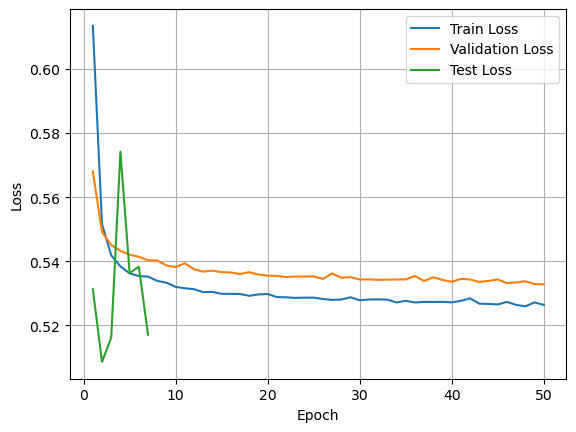

In [52]:
plt.plot(range(1, len(epoch_loss_values) + 1), epoch_loss_values, label='Train Loss')
plt.plot(range(1, len(validation_loss_values) + 1), validation_loss_values, label='Validation Loss')
plt.plot(range(1, len(test_losses) + 1), test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

**1.8. Plot input and output matrices for first three patients**

Subject ID: 704238


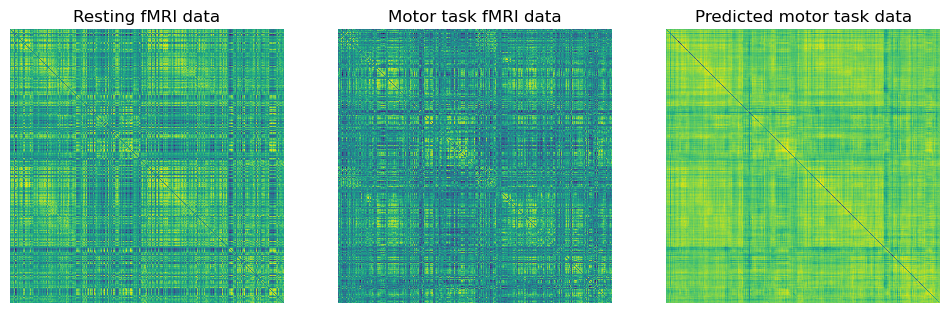

Subject ID: 163129


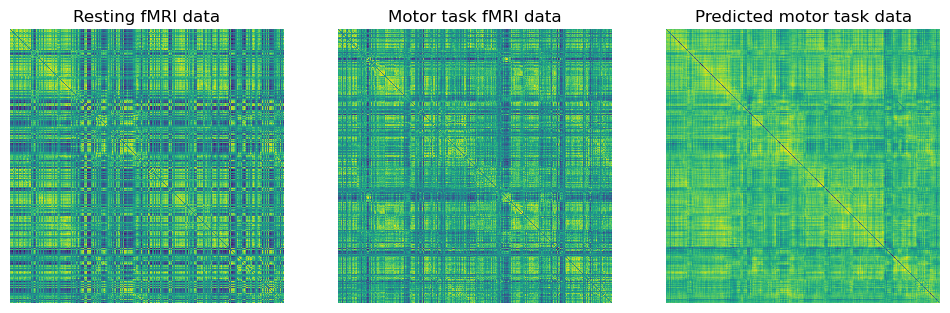

Subject ID: 108525


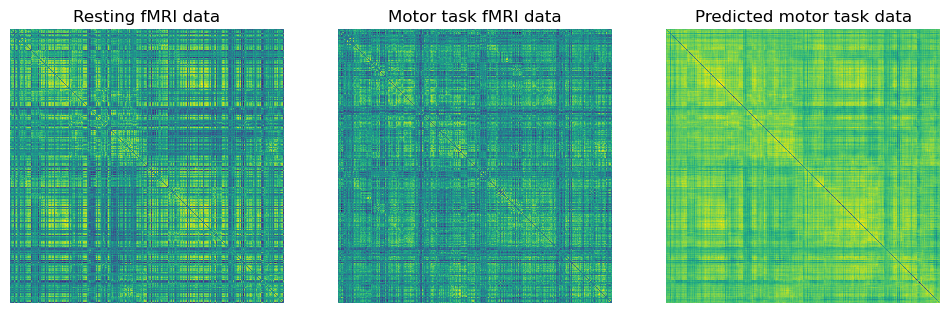

In [53]:
test_losses = test(model, test_data_loader, device)

with torch.no_grad():
    for i, batch_data in enumerate(test_data_loader):
        if i < 3:  # Print the first 3 elements
            rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
            rest = rest.to(device)
            motor = motor.to(device)
            outputs = model(rest)
            subject_id = test_ids[i]  

            print(f"Subject ID: {subject_id}")
            
            # Create a 1x3 subplot
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            
            # Resting fMRI data
            axes[0].set_title("Resting fMRI data")
            axes[0].imshow(rest[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[0].axis('off')
            
            # Motor task fMRI data
            axes[1].set_title("Motor task fMRI data")
            axes[1].imshow(motor[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[1].axis('off')
            
            # Predicted motor
            axes[2].set_title("Predicted motor task data")
            axes[2].imshow(outputs[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[2].axis('off')
            
            plt.show()

**1.9 Calculate MSE**

In [54]:
#MSE between output_matrix and mean_motor for bce 

output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each output matrix
mse_values = [torch.mean((output_matrix - mean_motor).pow(2)) for output_matrix in output_matrices]

# Calculate the overall MSE and standard deviation
overall_mse = torch.mean(torch.stack(mse_values))
std_deviation = torch.std(torch.stack(mse_values))

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")


Standard Deviation: 0.5321
MSE: 2.4338


In [119]:
#MSE between output_matrix and mean_motor for mse

output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each output matrix
mse_values = [torch.mean((output_matrix - mean_motor).pow(2)) for output_matrix in output_matrices]

# Calculate the overall MSE and standard deviation
overall_mse = torch.mean(torch.stack(mse_values))
std_deviation = torch.std(torch.stack(mse_values))

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")


Standard Deviation: 0.0017
MSE: 0.0091


In [70]:
output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

# Ensure the shapes of output_matrices and motor_matrices match
# Reshape motor_matrices if needed

bce_values = []

for output_matrix, motor_matrix in zip(output_matrices, motor_matrices):
    # Convert motor_matrix to a tensor
    motor = torch.from_numpy(motor_matrix)

    # Apply the sigmoid activation to the output_matrix
    output_matrix = torch.sigmoid(output_matrix)

    # Calculate BCE for each output_matrix and its corresponding motor data
    bce = - (motor * torch.log(output_matrix) + (1 - motor) * torch.log(1 - output_matrix))
    bce_values.append(bce.mean().item())

# Calculate the overall BCE and standard deviation
overall_bce = np.mean(bce_values)
std_deviation = np.std(bce_values)

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"BCE: {overall_bce:.4f}")


Standard Deviation: 0.1096
BCE: 0.5397


In [55]:
#MSE between output_matrix and motor for bce 
output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each output matrix
mse_values = [torch.mean((output_matrix - motor).pow(2)) for output_matrix in output_matrices]

# Calculate the overall MSE and standard deviation
overall_mse = torch.mean(torch.stack(mse_values))
std_deviation = torch.std(torch.stack(mse_values))

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")


Standard Deviation: 0.4836
MSE: 2.2112


In [118]:
#MSE between output_matrix and motor for mse
output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each output matrix
mse_values = [torch.mean((output_matrix - motor).pow(2)) for output_matrix in output_matrices]

# Calculate the overall MSE and standard deviation
overall_mse = torch.mean(torch.stack(mse_values))
std_deviation = torch.std(torch.stack(mse_values))

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")


Standard Deviation: 0.0020
MSE: 0.0457


In [55]:
#BCE between output_matrix and motor for bce 

import torch
import torch.nn.functional as F
import numpy as np

output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

# Calculate the mean motor matrix and reshape it to match output_matrix shape
mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))
mean_motor = mean_motor.unsqueeze(0)  # Add an extra dimension to match [1, 400, 400]

# Calculate BCE values for each output matrix (assuming binary targets)
bce_values = []

for output_matrix in output_matrices:
    bce = F.binary_cross_entropy_with_logits(output_matrix, mean_motor)
    bce_values.append(bce.item())

# Calculate the overall BCE and standard deviation
overall_bce = np.mean(bce_values)
std_deviation = np.std(bce_values)

print(f"Standard Deviation (BCE): {std_deviation:.4f}")
print(f"BCE: {overall_bce:.4f}")


Standard Deviation (BCE): 0.0056
BCE: 0.5474


In [117]:
#MSE baseline

# Calculate the mean motor matrix
mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each motor matrix
mse_values = []

for motor_matrix in motor_matrices:
    mse = mean_squared_error(motor_matrix, mean_motor.numpy())
    mse_values.append(mse)

# Calculate the overall MSE and standard deviation
overall_mse = np.mean(mse_values)
std_deviation = np.std(mse_values)

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")

Standard Deviation: 0.0286
MSE: 0.0463


In [56]:
#BCE baseline
mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate BCE values for each motor matrix (assuming binary targets)
bce_values = []

for motor_matrix in motor_matrices:
    motor_matrix = torch.from_numpy(motor_matrix)
    bce = F.binary_cross_entropy_with_logits(motor_matrix, mean_motor)
    bce_values.append(bce.item())

# Calculate the overall BCE and standard deviation
overall_bce = np.mean(bce_values)
std_deviation = np.std(bce_values)

print(f"Standard Deviation (BCE): {std_deviation:.4f}")
print(f"BCE: {overall_bce:.4f}")


Standard Deviation (BCE): 0.0292
BCE: 0.7580


In [ ]:
посчитать bce 
motor mean baseline 
bce motor mean
считать по двум лосам
подобрать парметры архитектуры (больше каналов, лернинг рейт)

In [184]:
len(output_matrices)

21

In [168]:
np.squeeze(output_matrix).shape

(21, 400, 400)

In [174]:
mean_motor_matrix.shape

(400, 400)

In [175]:
np.repeat(mean_motor_matrix[None,:],21, axis=0).shape

(21, 400, 400)

In [149]:
output_matrix.shape

(21, 1, 400, 400)

In [151]:
np.repeat(mean_motor_matrix, 21).shape

(3360000,)

In [153]:
mean_motor_matrix.shape

(400, 400)

In [143]:
outputs[0][0]

tensor([[0.2316, 0.2170, 0.2174,  ..., 0.2189, 0.1781, 0.1905],
        [0.2546, 0.2067, 0.2525,  ..., 0.2205, 0.1861, 0.1877],
        [0.2494, 0.2351, 0.1817,  ..., 0.1969, 0.1814, 0.1718],
        ...,
        [0.1940, 0.2070, 0.1927,  ..., 0.3275, 0.2168, 0.2413],
        [0.1818, 0.1874, 0.1819,  ..., 0.1797, 0.1695, 0.1695],
        [0.1609, 0.1878, 0.1577,  ..., 0.1846, 0.1688, 0.1699]],
       device='cuda:0')

In [135]:
mse_values = []

for rest_matrix, motor_matrix in zip(rest_matrices, motor_matrices):
    mse = mean_squared_error(rest_matrix, motor_matrix)
    mse_values.append(mse)

average_mse = np.mean(mse_values)

print(f"Average Mean Squared Error (MSE) between all 'rest' and 'motor' matrices: {average_mse:.4f}")

Average Mean Squared Error (MSE) between all 'rest' and 'motor' matrices: 0.1245


**1.9. Train with early stopping**

In [120]:
seed = 1380
torch.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [121]:
def test(model, test_data_loader, device):
    model.eval()
    test_losses = []

    for batch_data in test_data_loader:
        rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
        rest = rest.to(device)
        motor = motor.to(device)
        with torch.no_grad():
            outputs = model(rest)
        loss = loss_function(outputs, motor)
        test_losses.append(loss.item())

    return test_losses

def train(model, train_data_loader, validation_data_loader, max_epochs, learning_rate, device):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Train the model
model = AutoEncoder(
    spatial_dims=2,
    in_channels=1,
    out_channels=1,
    channels=(16, 32, 64),
    strides=(2, 2, 2),
).to(device)

# Create loss function and optimizer
loss_function = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), learning_rate)

epoch_loss_values = []
validation_loss_values = []  
test_loss_values = []  
best_validation_loss = float('inf')
patience = 5  
patience_counter = 0

t = trange(max_epochs, desc=f"Training -- epoch 0, avg loss: inf", leave=True)

for epoch in range(max_epochs):
    model.train()
    epoch_loss = 0
    step = 0

    for batch_data in train_data_loader:
        step += 1
        rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
        rest = rest.to(device)
        motor = motor.to(device)
        optimizer.zero_grad()
        outputs = model(rest)
        loss = loss_function(outputs, motor)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)

    # Calculate the validation loss
    model.eval()
    validation_loss = 0
    validation_step = 0

    with torch.no_grad():
        for batch_data in validation_data_loader:
            validation_step += 1
            rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
            rest = rest.to(device)
            motor = motor.to(device)
            outputs = model(rest)
            loss = loss_function(outputs, motor)
            validation_loss += loss.item()

    validation_loss /= validation_step
    validation_loss_values.append(validation_loss)  


    test_losses = test(model, test_data_loader, device)
    test_loss = np.mean(test_losses)
    test_loss_values.append(test_loss)

    t.set_description(f"AutoEncoder Training -- epoch {epoch + 1}" +
                      f", train loss: {epoch_loss:.4f}, val loss: {validation_loss:.4f}, test loss: {test_loss:.4f}")


    if validation_loss < best_validation_loss:
        best_validation_loss = validation_loss
        patience_counter = 0
        best_model = model.state_dict()
    else:
        patience_counter += 1

    if patience_counter >= patience:
        print(f"Early stopping at epoch {epoch + 1} as validation loss hasn't improved.")
        break

# Restore the best model
model.load_state_dict(best_model)

# Test the trained model on the test data
test_losses = test(model, test_data_loader, device)

AutoEncoder Training -- epoch 50, train loss: 0.0494, val loss: 0.0516, test loss: 0.0470:   0%|                                      | 0/50 [02:51<?, ?it/s]

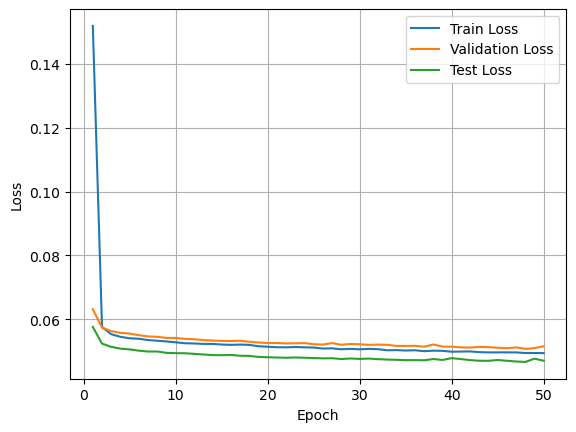

In [122]:
plt.plot(range(1, len(epoch_loss_values) + 1), epoch_loss_values, label='Train Loss')
plt.plot(range(1, len(validation_loss_values) + 1), validation_loss_values, label='Validation Loss')
plt.plot(range(1, len(test_loss_values) + 1), test_loss_values, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

Subject ID: 704238


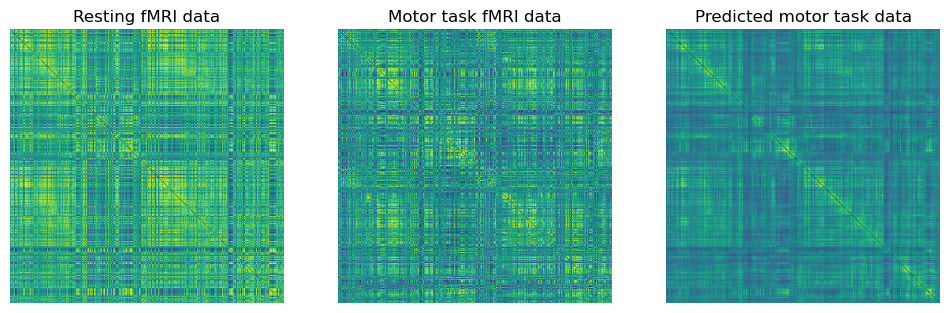

Subject ID: 163129


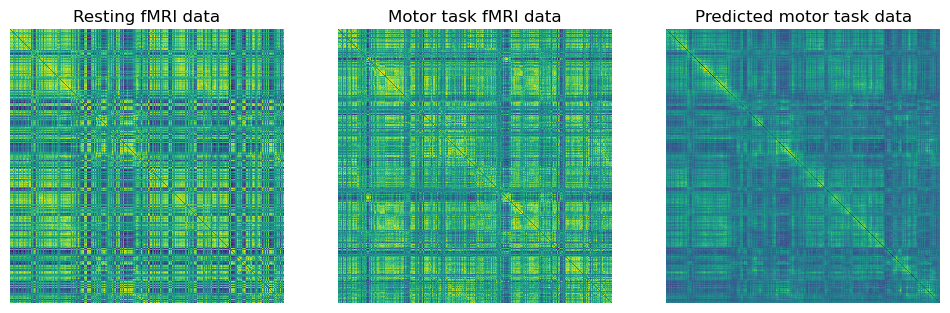

Subject ID: 108525


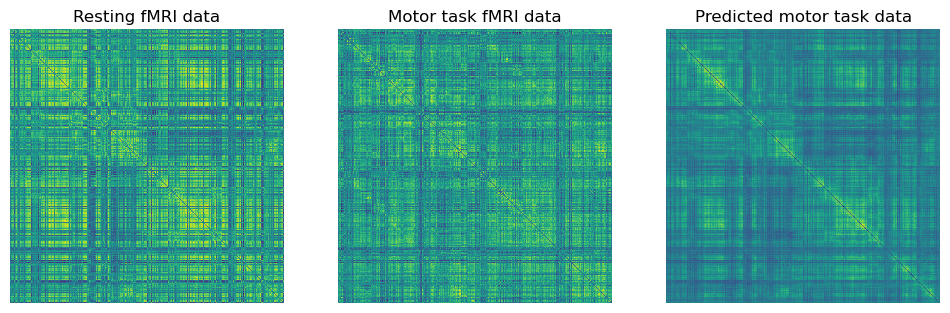

In [123]:
test_losses = test(model, test_data_loader, device)

with torch.no_grad():
    for i, batch_data in enumerate(test_data_loader):
        if i < 3:  # Print the first 3 elements
            rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
            rest = rest.to(device)
            motor = motor.to(device)
            outputs = model(rest)
            subject_id = test_ids[i]  

            print(f"Subject ID: {subject_id}")
            
            # Create a 1x3 subplot
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            
            # Resting fMRI data
            axes[0].set_title("Resting fMRI data")
            axes[0].imshow(rest[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[0].axis('off')
            
            # Motor task fMRI data
            axes[1].set_title("Motor task fMRI data")
            axes[1].imshow(motor[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[1].axis('off')
            
            # Predicted motor
            axes[2].set_title("Predicted motor task data")
            axes[2].imshow(outputs[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[2].axis('off')
            
            plt.show()

Baseline MSE

In [124]:
#MSE baseline

# Calculate the mean motor matrix
mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each motor matrix
mse_values = []

for motor_matrix in motor_matrices:
    mse = mean_squared_error(motor_matrix, mean_motor.numpy())
    mse_values.append(mse)

# Calculate the overall MSE and standard deviation
overall_mse = np.mean(mse_values)
std_deviation = np.std(mse_values)

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")

Standard Deviation: 0.0286
MSE: 0.0463


MSE between outputs and mean motor

In [126]:
#MSE between output_matrix and mean_motor for mse

output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each output matrix
mse_values = [torch.mean((output_matrix - motor).pow(2)) for output_matrix in output_matrices]

# Calculate the overall MSE and standard deviation
overall_mse = torch.mean(torch.stack(mse_values))
std_deviation = torch.std(torch.stack(mse_values))

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")

Standard Deviation: 0.0018
MSE: 0.0613


MSE between outputs and motor

In [ ]:
#MSE between output_matrix and mean_motor for mse

output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))

# Calculate MSE values for each output matrix
mse_values = [torch.mean((output_matrix - mean_motor).pow(2)) for output_matrix in output_matrices]

# Calculate the overall MSE and standard deviation
overall_mse = torch.mean(torch.stack(mse_values))
std_deviation = torch.std(torch.stack(mse_values))

print(f"Standard Deviation: {std_deviation:.4f}")
print(f"MSE: {overall_mse:.4f}")

In [110]:
output_sample = outputs[0][0].cpu().numpy()

motor_matrices = []

for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())
    
mean_motor_matrix = np.mean(motor_matrices, axis=0)

mse1 = mean_squared_error(output_sample, mean_motor_matrix)
print(f"Mean Squared Error (MSE) between one output matrix and the mean of all matrices in the training set: {mse1:.4f}")

Mean Squared Error (MSE) between one output matrix and the mean of all matrices in the training set: 0.0105


In [111]:
mse_values = []

for rest_matrix, motor_matrix in zip(rest_matrices, motor_matrices):
    mse = mean_squared_error(rest_matrix, motor_matrix)
    mse_values.append(mse)

# Calculate the average MSE between all rest matrices and all motor matrices
average_mse = np.mean(mse_values)

print(f"Average Mean Squared Error (MSE) between all 'rest' and 'motor' matrices: {average_mse:.4f}")

Average Mean Squared Error (MSE) between all 'rest' and 'motor' matrices: 0.1250


# VAE

epoch 100, average train loss: 28972.1010, test loss: 18975.4040: 100%|████████████████████████████████████████████████████| 100/100 [16:39<00:00,  9.99s/it]


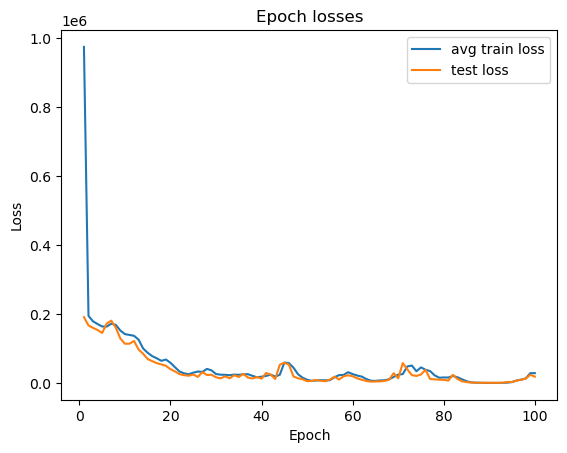

In [33]:
BCELoss = torch.nn.BCELoss()

def loss_function(recon_x, x, mu, log_var, beta):
    bce = BCELoss(recon_x, x)
    kld = -0.5 * beta * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return bce + kld

def train(max_epochs, learning_rate, beta):
    model = VarAutoEncoder(
        spatial_dims=2,
        in_shape=(1, 400, 400),
        out_channels=1,
        latent_size=2,
        channels=(16, 32, 64),
        strides=(1, 2, 2),
    ).to(device)  # Assuming 'device' is defined

    # Create optimizer
    optimizer = torch.optim.Adam(model.parameters(), learning_rate)

    avg_train_losses = []
    test_losses = []

    t = trange(max_epochs, leave=True, desc="epoch 0, average train loss: ?, test loss: ?")
    for epoch in t:
        model.train()
        epoch_loss = 0
        num_batches = 0  # Add a counter for the number of batches

        for batch_data in train_data_loader:
            rest, motor = batch_data["rest_fMRI_data"].to(device), batch_data["motor_task_fMRI_data"].to(device)
            optimizer.zero_grad()

            recon_batch, mu, log_var, _ = model(motor)
            loss = loss_function(recon_batch, motor, mu, log_var, beta)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

            # Increment the batch counter
            num_batches += 1

        # Calculate the average loss for this epoch
        avg_epoch_loss = epoch_loss / num_batches
        avg_train_losses.append(avg_epoch_loss)

        # Test
        model.eval()
        test_loss = 0
        num_batches = 0

        with torch.no_grad():
            for batch_data in test_data_loader:
                rest, motor = batch_data["rest_fMRI_data"].to(device), batch_data["motor_task_fMRI_data"].to(device)
                recon, mu, log_var, _ = model(motor)
                test_loss += loss_function(recon, motor, mu, log_var, beta).item()

                # Increment the batch counter
                num_batches += 1

        avg_test_loss = test_loss / num_batches
        test_losses.append(avg_test_loss)

        model.train()  # Set the model back to training mode

        t.set_description(
            f"epoch {epoch + 1}, average train loss: " f"{avg_epoch_loss:.4f}, test loss: {avg_test_loss:.4f}"
        )
    
    # Return the trained model and the average train and test losses
    return model, avg_train_losses, test_losses

max_epochs = 100
learning_rate = 1e-4
beta = 100  # KL beta weighting. Increase for disentangled VAE
latent_size = 2

# Train the model
model, avg_train_losses, test_losses = train(max_epochs, learning_rate, beta)

# Plot the losses
import matplotlib.pyplot as plt

plt.figure()
plt.title("Epoch losses")
plt.xlabel("Epoch")
plt.ylabel("Loss")
for y, label in zip([avg_train_losses, test_losses], ["avg train loss", "test loss"]):
    x = list(range(1, len(y) + 1))
    (line,) = plt.plot(x, y)
    line.set_label(label)
plt.legend()
plt.show()


Subject ID: 704238
First rest_fMRI_data:


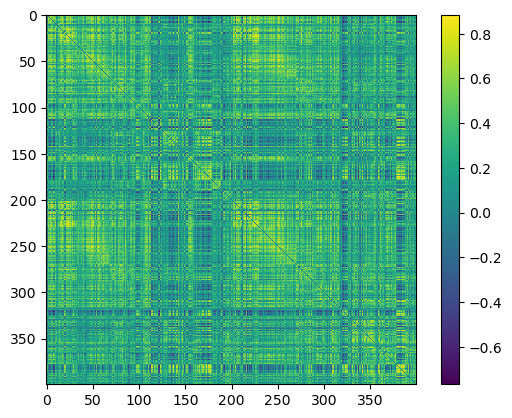

First motor_task_fMRI_data:


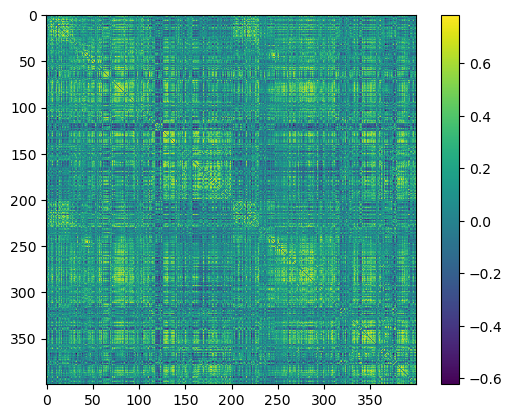

First outputs:


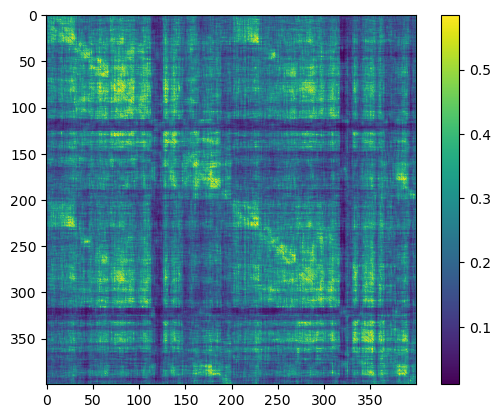

In [115]:
import matplotlib.pyplot as plt

# # Test the trained model on the test data
# test_losses = test(model, test_data_loader, device)

# Print the first rest_fMRI_data, motor_task_fMRI_data, and outputs as heatmaps with subject IDs
with torch.no_grad():
    for i, batch_data in enumerate(test_data_loader):
        rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
        rest = rest.to(device)
        motor = motor.to(device)
        outputs = model(rest)
        subject_id = test_ids[i]  

        print(f"Subject ID: {subject_id}")
        
        # Resting fMRI data
        print("First rest_fMRI_data:")
        plt.imshow(rest[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
        plt.colorbar()
        plt.show()
        
        # Motor task fMRI data
        print("First motor_task_fMRI_data:")
        plt.imshow(motor[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
        plt.colorbar()
        plt.show()
        
        # Predicted motor
        print("First outputs:")
        plt.imshow(outputs[0][0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
        plt.colorbar()
        plt.show()

        break


Subject ID: 704238


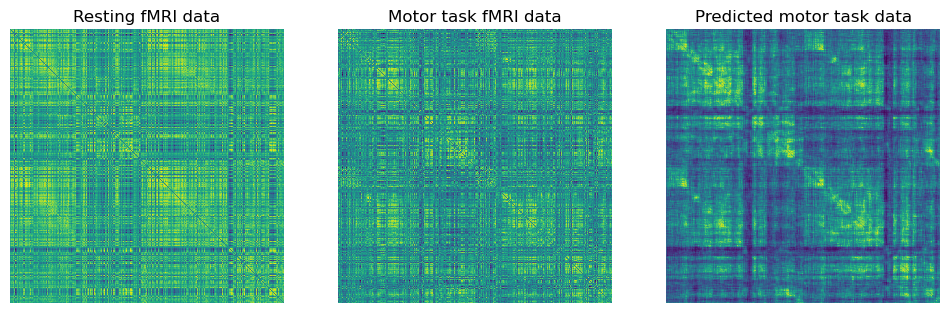

Subject ID: 163129


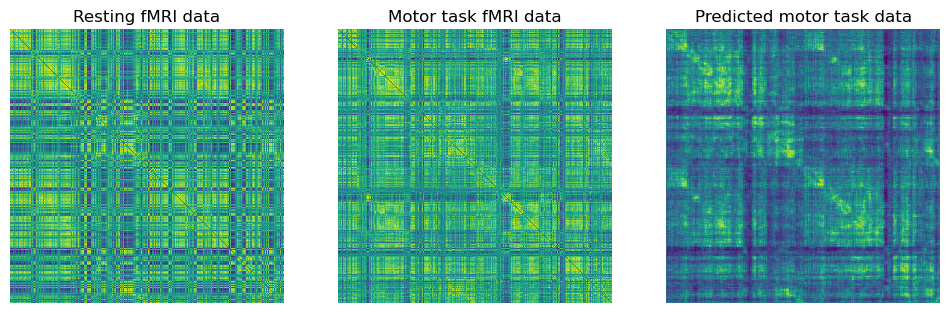

Subject ID: 108525


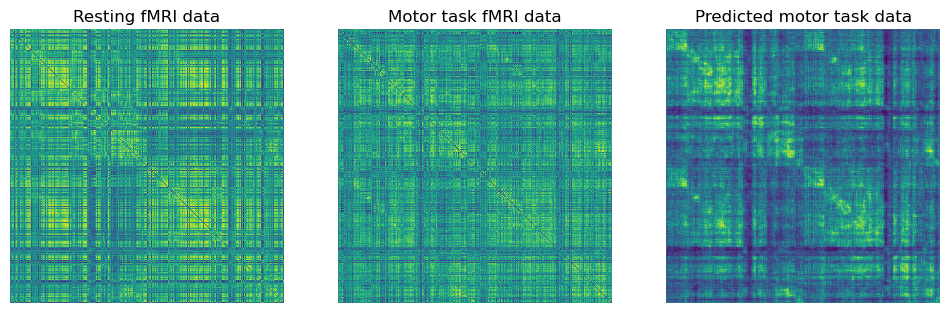

In [39]:
# test_losses = test(model, test_data_loader, device)

with torch.no_grad():
    for i, batch_data in enumerate(test_data_loader):
        if i < 3:  # Print the first 3 elements
            rest, motor = batch_data["rest_fMRI_data"], batch_data["motor_task_fMRI_data"]
            rest = rest.to(device)
            motor = motor.to(device)
            outputs = model(rest)
            subject_id = test_ids[i]  

            print(f"Subject ID: {subject_id}")
            
            # Create a 1x3 subplot
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            
            # Resting fMRI data
            axes[0].set_title("Resting fMRI data")
            axes[0].imshow(rest[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[0].axis('off')
            
            # Motor task fMRI data
            axes[1].set_title("Motor task fMRI data")
            axes[1].imshow(motor[0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[1].axis('off')
            
            # Predicted motor
            axes[2].set_title("Predicted motor task data")
            axes[2].imshow(outputs[0][0][0].cpu().numpy(), cmap='viridis', interpolation='nearest')
            axes[2].axis('off')
            
            plt.show()

In [123]:
#BCE between output_matrix and motor for bce 

import torch
import torch.nn.functional as F
import numpy as np

output_matrices = [torch.from_numpy(output.cpu().numpy()) for output in outputs]

motor_matrices = []
for batch_data in train_data_loader:
    motor = batch_data["motor_task_fMRI_data"]
    motor_matrices.extend(motor[:, 0, :, :].cpu().numpy())

# Calculate the mean motor matrix and reshape it to match output_matrix shape
mean_motor = torch.from_numpy(np.mean(motor_matrices, axis=0))
mean_motor = mean_motor.unsqueeze(0)  # Add an extra dimension to match [1, 400, 400]

# Calculate BCE values for each output matrix (assuming binary targets)
bce_values = []

for output_matrix in output_matrices:
    bce = F.binary_cross_entropy_with_logits(output_matrix, mean_motor)
    bce_values.append(bce.item())

# Calculate the overall BCE and standard deviation
overall_bce = np.mean(bce_values)
std_deviation = np.std(bce_values)

print(f"Standard Deviation (BCE): {std_deviation:.4f}")
print(f"BCE: {overall_bce:.4f}")

ValueError: Target size (torch.Size([1, 400, 400])) must be the same as input size (torch.Size([21, 1, 400, 400]))

In [126]:
mean_motor_matrix.shape

(400, 400)

In [134]:
output_matrix.shape

torch.Size([21, 1, 400, 400])

In [145]:
meanmotor=np.repeat(mean_motor_matrix[None,:],21, axis=0).shape
meanmotor

(21, 400, 400)

In [135]:
output_matrix[None,:].shape

torch.Size([1, 21, 1, 400, 400])

In [136]:
import torch

# Assuming you have your tensor named 'output_matrix'
output_matrix = torch.randn(21, 1, 400, 400)

# Remove the dimension with size 1
output_matrix_squeezed = output_matrix.squeeze(1)

# Now, 'output_matrix_squeezed' will have the shape [21, 400, 400]


In [138]:
output_matrix_squeezed.shape

torch.Size([21, 400, 400])